# The Task

Find a risky transaction that will become a chargeback (state=chargeback or refund+fees)

Enclosed are

Transactions with their meta data
Subscriptions, Each transaction create a subscription object
User attributes, what we collected about a user
User identified by ClientID and by a GUID (a PC unique stamp, usually 1 pc = 1 user)

There is a lot of extra info that may or may not be used

Transactions https://fast-test-datasci.s3.amazonaws.com/trans.rar

Subscriptions https://fast-test-datasci.s3.amazonaws.com/ccsubs.rar

User Attribute https://fast-test-datasci.s3.amazonaws.com/attr.rar

## >Використані бібліотеки

In [2]:
from sklearn import datasets
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import sklearn
import re

## >Завантаження даних 

In [3]:
df1 = pd.read_csv('Атрибут користувача 1.csv')

In [4]:
df2 = pd.read_csv('Атрибут користувача 2.csv')

C:\Users\BU400A\AppData\Local\Temp\ipykernel_11784\3186476912.py:1: DtypeWarning: Columns (52) have mixed types. Specify dtype option on import or set low_memory=False.
  df2 = pd.read_csv('Атрибут користувача 2.csv')


In [5]:
df3 = pd.read_csv('Атрибут користувача 3.csv')

In [6]:
df4 = pd.read_csv('Атрибут користувача 4.csv')

C:\Users\BU400A\AppData\Local\Temp\ipykernel_11784\4185521652.py:1: DtypeWarning: Columns (17) have mixed types. Specify dtype option on import or set low_memory=False.
  df4 = pd.read_csv('Атрибут користувача 4.csv')


In [7]:
df5 = pd.read_csv('Атрибут користувача 5.csv')

In [8]:
transac = pd.read_csv('Transactions.txt', delimiter='\t')

C:\Users\BU400A\AppData\Local\Temp\ipykernel_11784\2270557742.py:1: DtypeWarning: Columns (0,1,2,6,7,14,16) have mixed types. Specify dtype option on import or set low_memory=False.
  transac = pd.read_csv('Transactions.txt', delimiter='\t')


In [9]:
ccsubs = pd.read_csv('CC and subscriptions.txt', delimiter='\t')

## >Виведення основної інформації про дані

In [13]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3747 entries, 0 to 3746
Columns: 148 entries, id to d
dtypes: float64(15), int64(70), object(63)
memory usage: 4.2+ MB


In [14]:
df1.head()

,id,referrer,src_domain,src_url,campaign_last,campaign_first,at,ai,same_campaign,campaign_visits,...,user_agent,ip,geo,ip_city,ip_state_iso,ip_state_name,ip_tz,ip_tzo,risk,d
0,4568921,-,NaN,NaN,activeTrail,activeTrail,NaN,NaN,0,0,...,Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15) ...,24.140.168.18,US,Massillon,OH,Ohio,America/New_York,240,{},200210
1,4569179,-,NaN,NaN,activeTrail,activeTrail,NaN,NaN,0,0,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,92.5.101.53,GB,Doncaster,DNC,Doncaster,Europe/London,-60,{},200210
2,4569217,-,NaN,NaN,activeTrail,activeTrail,NaN,NaN,0,0,...,Mozilla/5.0 (iPhone; CPU iPhone OS 13_3_1 like...,86.162.82.27,GB,Morpeth,NBL,Northumberland,Europe/London,-60,{},200210
3,4337476,-,NaN,NaN,NaN,NaN,NaN,NaN,0,0,...,Mozilla/5.0 (iPhone; CPU iPhone OS 13_3_1 like...,73.53.100.16,US,Auburn,WA,Washington,America/Los_Angeles,420,{},200210
4,4569451,-,NaN,NaN,activeTrail,activeTrail,NaN,NaN,0,0,...,Mozilla/5.0 (iPhone; CPU iPhone OS 13_3_1 like...,73.206.136.220,US,Houston,TX,Texas,America/Chicago,300,{},200210


In [15]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4659 entries, 0 to 4658
Columns: 148 entries, id to d
dtypes: float64(15), int64(71), object(62)
memory usage: 5.3+ MB


In [19]:
df2.head()

,id,referrer,src_domain,src_url,campaign_last,campaign_first,at,ai,same_campaign,campaign_visits,...,user_agent,ip,geo,ip_city,ip_state_iso,ip_state_name,ip_tz,ip_tzo,risk,d
0,11896214,https://www.bing.com/,bing.com,www.bing.com/,topav_au,topav_au,NaN,NaN,1,1,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,110.140.32.76,AU,Melbourne,VIC,Victoria,Australia/Melbourne,-600,{},210527
1,12079640,https://googleads.g.doubleclick.net/,googleads.g.doubleclick.net,googleads.g.doubleclick.net/,wdl_fa_ww,wdl_fa_ww,NaN,software,1,1,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,118.210.63.201,AU,Blackwood,SA,South Australia,Australia/Adelaide,-15450,{},200610
2,12115595,https://googleads.g.doubleclick.net/,googleads.g.doubleclick.net,googleads.g.doubleclick.net/,wdl_fa_ww_mcf,wdl_fa_ww_mcf,NaN,software,1,1,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,174.219.3.189,US,Saint Paul,MN,Minnesota,America/Chicago,300,{},210827
3,4676792,-,NaN,NaN,activeTrail,em_msoffice_1_1,NaN,opt10000d,1,1,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,66.249.84.184,US,Spruce Grove,AB,Alberta,America/Edmonton,780,{},200417
4,11949247,https://googleads.g.doubleclick.net/pagead/ads...,popsilla.com,www.popsilla.com/au.com.kayosports,wdl_2x2min,wdl_2x2min,NaN,software,1,2,...,Mozilla/5.0 (Windows NT 6.1; WOW64; Trident/7....,49.199.16.62,AU,Richmond,VIC,Victoria,Australia/Melbourne,-600,{},210620


In [16]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4055 entries, 0 to 4054
Columns: 148 entries, id to d
dtypes: float64(14), int64(71), object(63)
memory usage: 4.6+ MB


In [20]:
df3.head()

,id,referrer,src_domain,src_url,campaign_last,campaign_first,at,ai,same_campaign,campaign_visits,...,user_agent,ip,geo,ip_city,ip_state_iso,ip_state_name,ip_tz,ip_tzo,risk,d
0,28977539,https://www.google.com/,google.com,www.google.com/,telegram_search,telegram_search,NaN,NaN,1,1,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,102.165.48.100,US,Washington,DC,District of Columbia,America/New_York,240,"{""mac"": {""gateway"": ""C8EAF849F00E"", ""net_local...",221012
1,10185115,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,141.226.140.100,US,Copenhagen,84,Capital Region,Europe/Copenhagen,-120,{},201127
2,11065006,https://googleads.g.doubleclick.net/,googleads.g.doubleclick.net,googleads.g.doubleclick.net/,wdl_fa_ww3,wdl_fa_ww3,businessProductivitySoftware,mobileEnthusiasts,1,1,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,99.228.247.235,CA,Maple,ON,Ontario,America/Toronto,540,{},201227
3,11088770,https://googleads.g.doubleclick.net/,googleads.g.doubleclick.net,googleads.g.doubleclick.net/,sms,zzy,NaN,NaN,0,4,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,1.157.9.60,AU,Gungahlin,ACT,Australian Capital Territory,Australia/Sydney,-600,{},210106
4,11090271,https://googleads.g.doubleclick.net/,googleads.g.doubleclick.net,googleads.g.doubleclick.net/,wdy,wdy,businessProductivitySoftware,software,1,1,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,99.6.232.251,US,Dallas,TX,Texas,America/Chicago,300,{},210106


In [17]:
df4.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5116 entries, 0 to 5115
Columns: 148 entries, id to d
dtypes: float64(17), int64(71), object(60)
memory usage: 5.8+ MB


In [21]:
df4.head()

,id,referrer,src_domain,src_url,campaign_last,campaign_first,at,ai,same_campaign,campaign_visits,...,user_agent,ip,geo,ip_city,ip_state_iso,ip_state_name,ip_tz,ip_tzo,risk,d
0,26642248,https://googleads.g.doubleclick.net/,googleads.g.doubleclick.net,googleads.g.doubleclick.net/,wdl_fa_ww4,wdl_fa_ww4,NaN,NaN,1,1,...,Mozilla/5.0 (Windows NT 10.0) AppleWebKit/537....,99.247.34.202,CA,Mississauga,ON,Ontario,America/Toronto,300,"{""ip"": {""iprisk"": ""0.01"", ""riskscore"": ""0.17""}...",220222
1,26642423,https://googleads.g.doubleclick.net/,googleads.g.doubleclick.net,googleads.g.doubleclick.net/,wdl_fa_legacy,wdl_fa_legacy,NaN,mcafeeOffice,1,1,...,Mozilla/5.0 (Windows NT 6.1) AppleWebKit/537.3...,184.144.155.15,CA,Salaberry-de-Valleyfield,QC,Quebec,America/Toronto,300,"{""mac"": {""gateway"": ""C03C041D5768"", ""net_local...",220222
2,26642479,https://googleads.g.doubleclick.net/,googleads.g.doubleclick.net,googleads.g.doubleclick.net/,wdl_fa_legacy,wdl_fa_legacy,NaN,mcafeeOffice,1,1,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,1.158.56.45,AU,Annandale,NSW,New South Wales,Australia/Sydney,-660,"{""ip"": {""iprisk"": ""0.01"", ""riskscore"": ""0.1""},...",220222
3,26642817,https://googleads.g.doubleclick.net/,googleads.g.doubleclick.net,googleads.g.doubleclick.net/,wdl_fa_ww4,wdl_fa_ww4,androidApps,HostedDataCloudStorage,1,1,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,108.180.15.39,CA,Campbell River,BC,British Columbia,America/Vancouver,900,"{""ip"": {""iprisk"": ""0.01"", ""riskscore"": ""0.1""},...",220222
4,26642837,https://googleads.g.doubleclick.net/,googleads.g.doubleclick.net,googleads.g.doubleclick.net/,wdl_fa_legacy,wdl_fa_legacy,NaN,mcafeeOffice,1,2,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,58.168.208.94,AU,Chatswood,NSW,New South Wales,Australia/Sydney,-660,"{""ip"": {""iprisk"": ""0.01"", ""riskscore"": ""0.1""},...",220222


In [18]:
df5.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3848 entries, 0 to 3847
Columns: 148 entries, id to d
dtypes: float64(16), int64(70), object(62)
memory usage: 4.3+ MB


In [22]:
df5.head()

,id,referrer,src_domain,src_url,campaign_last,campaign_first,at,ai,same_campaign,campaign_visits,...,user_agent,ip,geo,ip_city,ip_state_iso,ip_state_name,ip_tz,ip_tzo,risk,d
0,4928742,-,NaN,NaN,NaN,NaN,NaN,NaN,0,0,...,NaN,69.147.90.254,US,Lake Oswego,OR,Oregon,America/Los_Angeles,420,{},200516
1,7812729,-,NaN,NaN,NaN,NaN,NaN,NaN,0,0,...,Mozilla/5.0 (iPhone; CPU iPhone OS 13_4_1 like...,184.148.36.66,CA,St. Catharines,ON,Ontario,America/Toronto,240,{},200516
2,9757139,https://googleads.g.doubleclick.net/pagead/ads...,appdirectory.online,www.appdirectory.online/download/itunes/,wdl_fa_ww,wdl_fa_ww,NaN,software,1,1,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,134.41.223.52,CA,Bay Roberts,NL,Newfoundland and Labrador,America/St_Johns,150,{},200516
3,4804078,-,NaN,NaN,NaN,NaN,NaN,NaN,0,0,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,70.120.213.17,US,Uvalde,TX,Texas,America/Chicago,300,{},200516
4,4802995,-,NaN,NaN,NaN,NaN,NaN,NaN,0,0,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,69.147.90.62,US,Mountain Ranch,CA,California,America/Los_Angeles,720,{},200518


In [23]:
transac.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 92167 entries, 0 to 92166
Data columns (total 19 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               92167 non-null  object 
 1   customer_id      92167 non-null  object 
 2   subscription_id  92167 non-null  object 
 3   guid             91609 non-null  object 
 4   email            90421 non-null  object 
 5   geo              91695 non-null  object 
 6   amount           92166 non-null  object 
 7   returns          92166 non-null  object 
 8   item_name        91927 non-null  object 
 9   item_key         80821 non-null  object 
 10  campaign         76931 non-null  object 
 11  state            92120 non-null  object 
 12  created_time     92165 non-null  float64
 13  provider         92161 non-null  object 
 14  oid              39268 non-null  object 
 15  descriptor       65556 non-null  object 
 16  strategy_id      40839 non-null  object 
 17  strategy_con

In [24]:
transac.head()

,id,customer_id,subscription_id,guid,email,geo,amount,returns,item_name,item_key,campaign,state,created_time,provider,oid,descriptor,strategy_id,strategy_config,json
0,11,7,0,03000200-0400-0500-0006-000700080009,email@btinternet.com,IL,2.95,0,Fast! (monthly),NaN,batch001,Completed,1.489680e+09,UpClick,NaN,NaN,NaN,{},"{""id"": ""5"", ""chk"": ""1FE690276694C82917A14E5CD1..."
1,13,9,0,B9B14F7F-76FC-11DD-B661-DDA0BF0C50C1,email@eletewireless.co.za,ZA,2.95,0,Fast! (monthly),NaN,NaN,Completed,1.489919e+09,UpClick,NaN,NaN,NaN,{},"{""id"": ""7"", ""chk"": ""D170AA7E27F35C557F7B1298CC..."
2,14,10,0,2A183F20-3890-11DF-9257-7071BC05CE48,email@iafrica.com,ZA,49.95,0,Fast! (annual),NaN,NaN,Completed,1.490161e+09,UpClick,NaN,NaN,NaN,{},"{""id"": ""8"", ""chk"": ""EBA378D55BE333A21804A32ABF..."
3,15,11,0,30464E43-3035-5838-3636-78ACC049073C,email@hotmail.com,TR,2.95,0,Fast! (monthly),NaN,NaN,Completed,1.490196e+09,UpClick,NaN,NaN,NaN,{},"{""id"": ""9"", ""chk"": ""EC1F5BE747C6562C1B4CCCD690..."
4,16,12,0,515F4572-DBEC-CB41-A8CD-2EF2BEAB71DE,email@gmail.com,MY,2.95,0,Fast! (monthly),NaN,NaN,Completed,1.490203e+09,UpClick,NaN,NaN,NaN,{},"{""id"": ""10"", ""chk"": ""DA8E21E922F97C1F5D5E259E7..."


In [25]:
ccsubs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60932 entries, 0 to 60931
Data columns (total 18 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 60932 non-null  int64  
 1   customer_id        60932 non-null  int64  
 2   guid               60931 non-null  object 
 3   page               56994 non-null  object 
 4   shopper_id         48485 non-null  float64
 5   created_time       60932 non-null  int64  
 6   last_billing_time  60932 non-null  int64  
 7   next_billing_time  60932 non-null  int64  
 8   amount             60932 non-null  float64
 9   ltv                60932 non-null  float64
 10  interval_sec       60932 non-null  int64  
 11  state              60932 non-null  object 
 12  retry_count        60932 non-null  int64  
 13  descriptor         54993 non-null  object 
 14  meta_data          60932 non-null  object 
 15  log_json           60932 non-null  object 
 16  strategy_id        370

In [26]:
ccsubs.head()

,id,customer_id,guid,page,shopper_id,created_time,last_billing_time,next_billing_time,amount,ltv,interval_sec,state,retry_count,descriptor,meta_data,log_json,strategy_id,strategy_config
0,1,44444,FAB0479A-96FD-4F73-9FBE-B418C9F47B69,NaN,116923660.0,1601072965,1603665060,1603837860,9.99,139.86,2592000,declined,1,NaN,{},"[\n {\n ""time"": 1567028797,\n ...",NaN,{}
1,3,44493,1DC99082-1185-11DF-BBDA-85804582D8D3,NaN,117013344.0,1577488083,1577488083,1580080083,9.99,49.95,2592000,canceled,0,NaN,{},"[{""time"":1567119645,""comment"":""success purchas...",NaN,{}
2,4,44510,35444335-3334-4B35-3956-B05ADADD0E80,NaN,117180938.0,1596786634,1596786634,1596786387,9.99,109.89,2592000,failed,5,NaN,{},"[\n {\n ""time"": 1567187352,\n ...",NaN,{}
3,5,44513,4C4C4544-0030-3910-8044-B9C04F545231,NaN,118633050.0,1574982120,1574982120,0,9.99,29.97,2592000,failed,12,NaN,{},"[{""time"":1568255087,""comment"":""success purchas...",NaN,{}
4,6,44599,4C4C4544-004E-4710-8034-C6C04F475432,NaN,117852486.0,1572824502,1572824502,0,4.99,14.97,2592000,failed,10,NaN,{},"[{""time"":1567640136,""comment"":""success purchas...",NaN,{}


## >Попередній статестичний аналіз даних та їх візуалізація

### Виведення скатер-плотів, які показують розподіл підписок

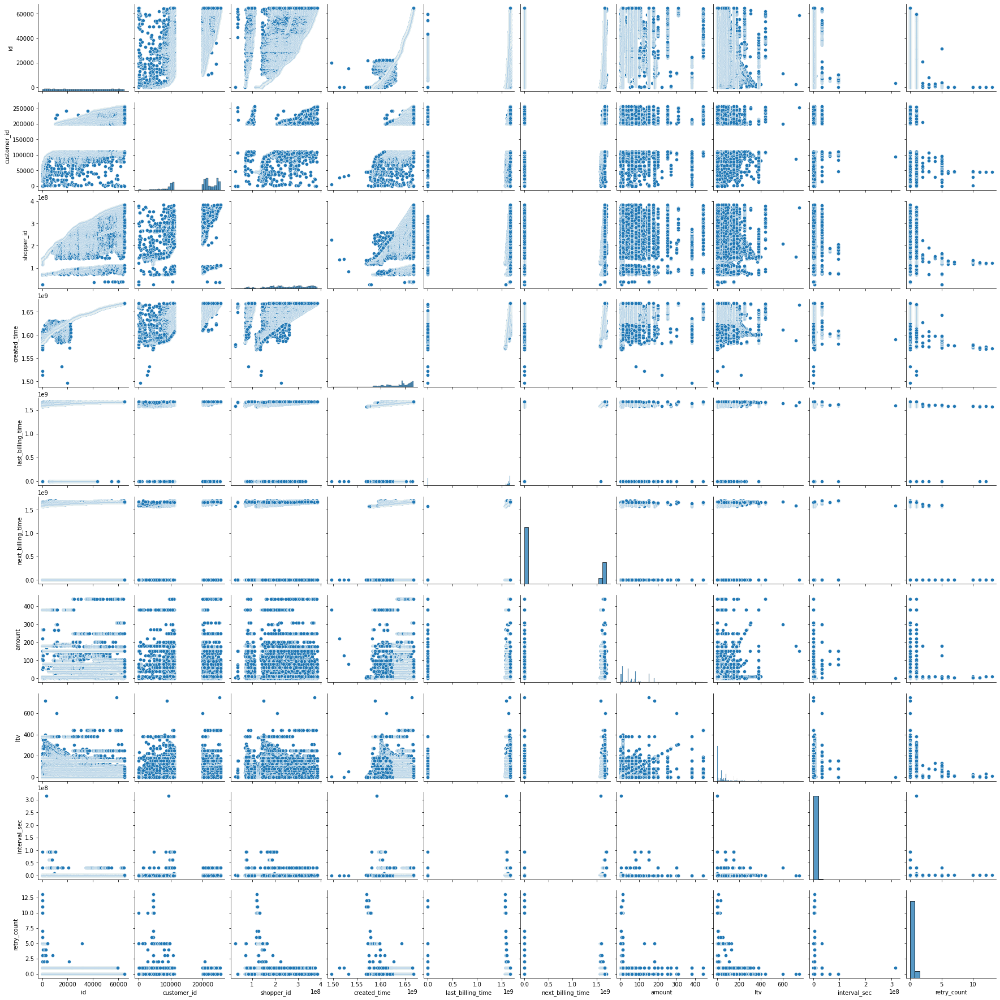

In [13]:
sns.pairplot(ccsubs) 
plt.show()

В нашому випадку це не дуже інформатвно ( хоч в цілому це досить зручно візуалізувати для задачі регресії).
Для нашої задачі є сенс дивитися на графіки розсіювання між цільовою змінною та кожним признаком окремо (незалежна змінна).

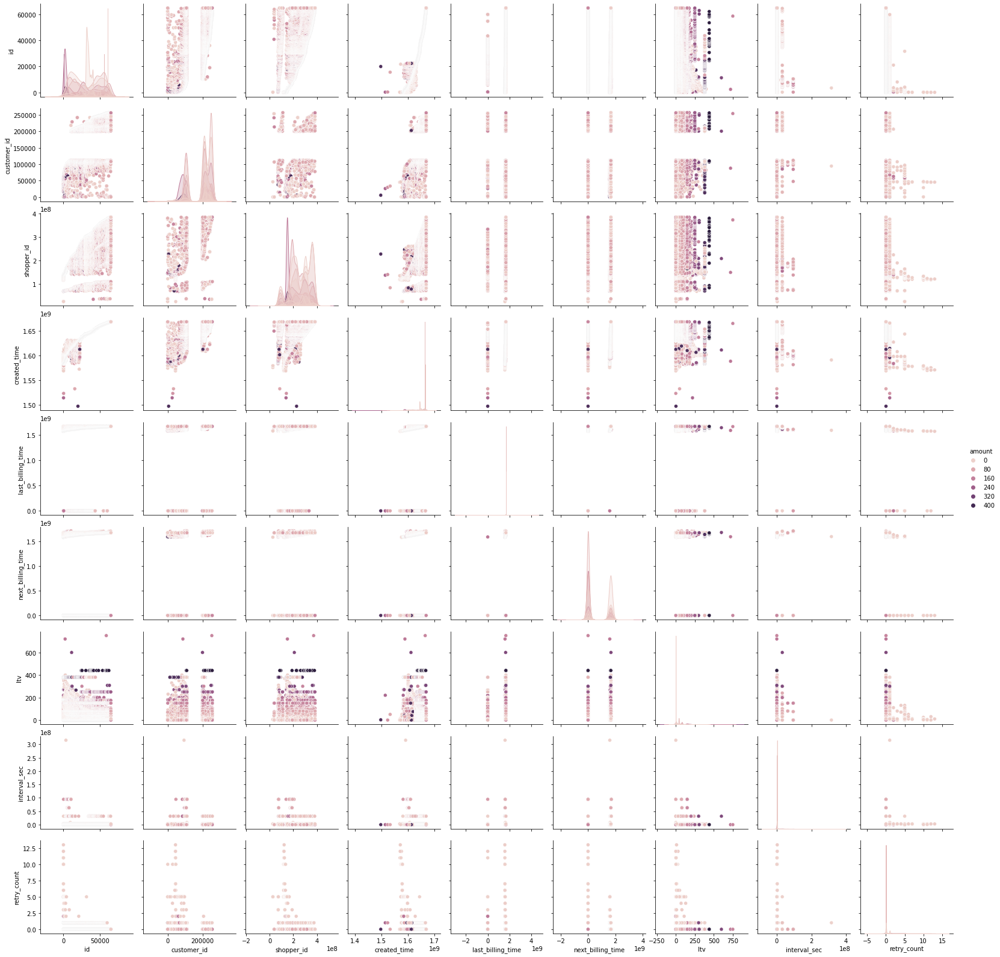

In [14]:
sns.pairplot(ccsubs, hue='amount') #Узято "amount" як цільову змінну для прикладу
plt.show()   

### Виведення скатер-плотів, які показують розподіл транзакцій

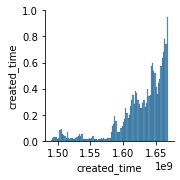

In [15]:
sns.pairplot(transac) 
plt.show()

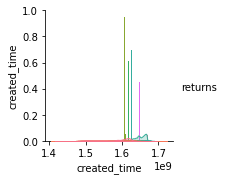

In [16]:
sns.pairplot(transac, hue='returns') # Спробув вивести графік із цільовою зміною "returns"
plt.show()  

In [ ]:
# pairplot з фреймами df1-df5 у мене не завантажуться у звязку з великим об'ємом пам'яті (комп не витягує)

### Теплова карта з допомогою Сіборновського "heatmap"

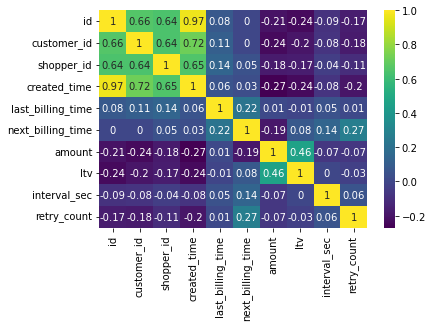

In [21]:
sns.heatmap(ccsubs.corr().round(2), annot=True, cmap='viridis')
plt.show()

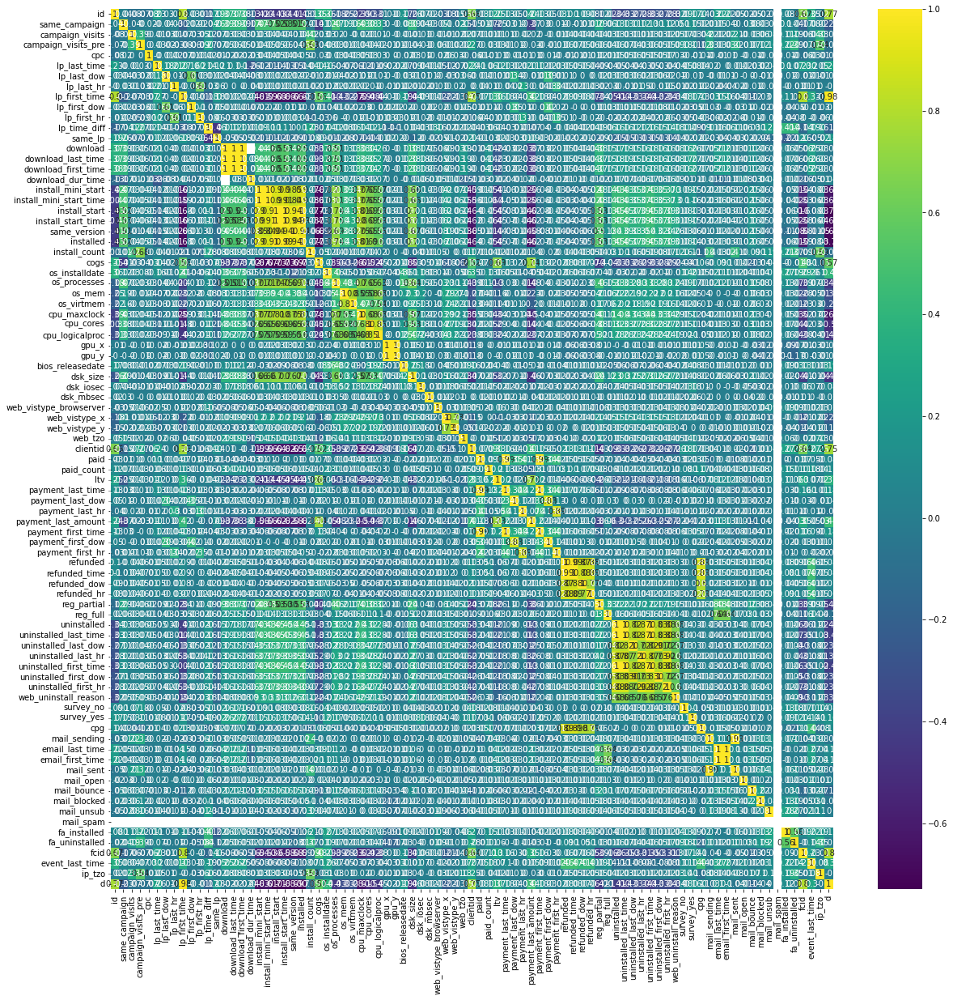

In [14]:
plt.figure(figsize=(20, 20))
sns.heatmap(df1.corr().round(2), annot=True, cmap='viridis')
plt.show()

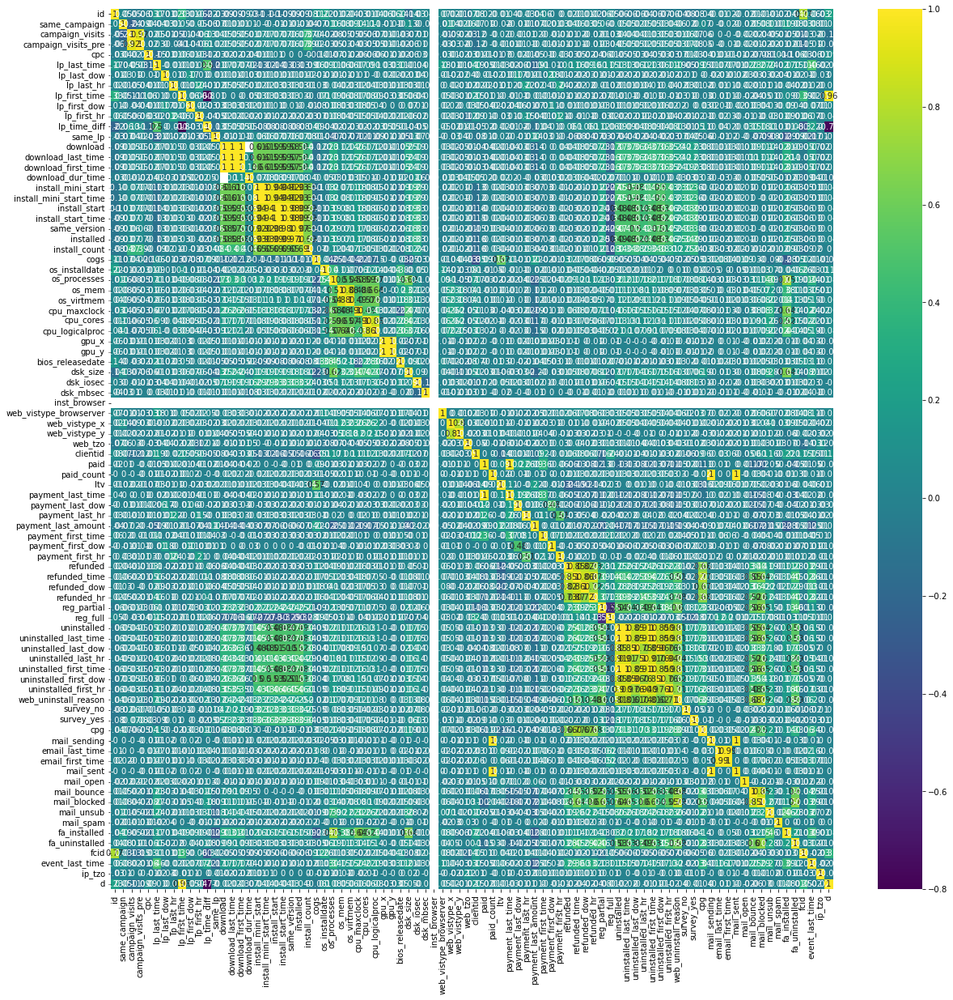

In [13]:
plt.figure(figsize=(20, 20))
sns.heatmap(df2.corr().round(2), annot=True, cmap='viridis')
plt.show()

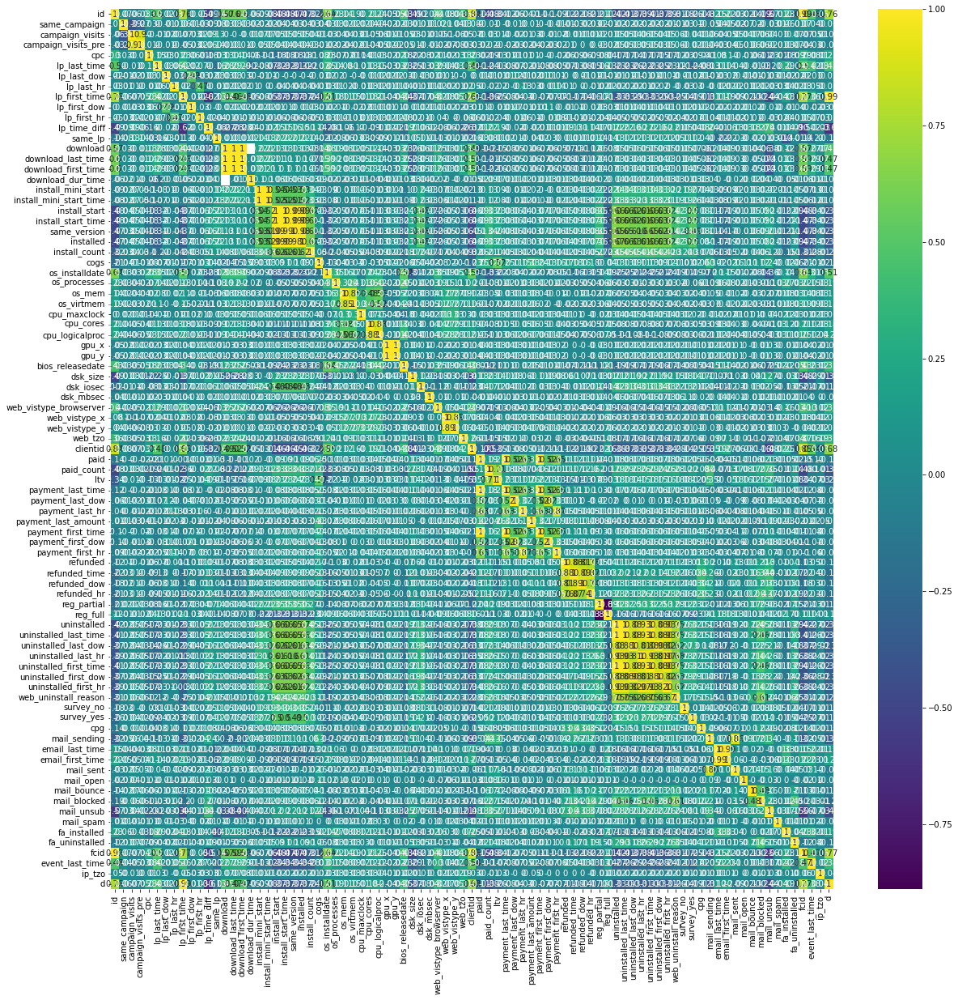

In [12]:
plt.figure(figsize=(20, 20))
sns.heatmap(df3.corr().round(2), annot=True, cmap='viridis')
plt.show()

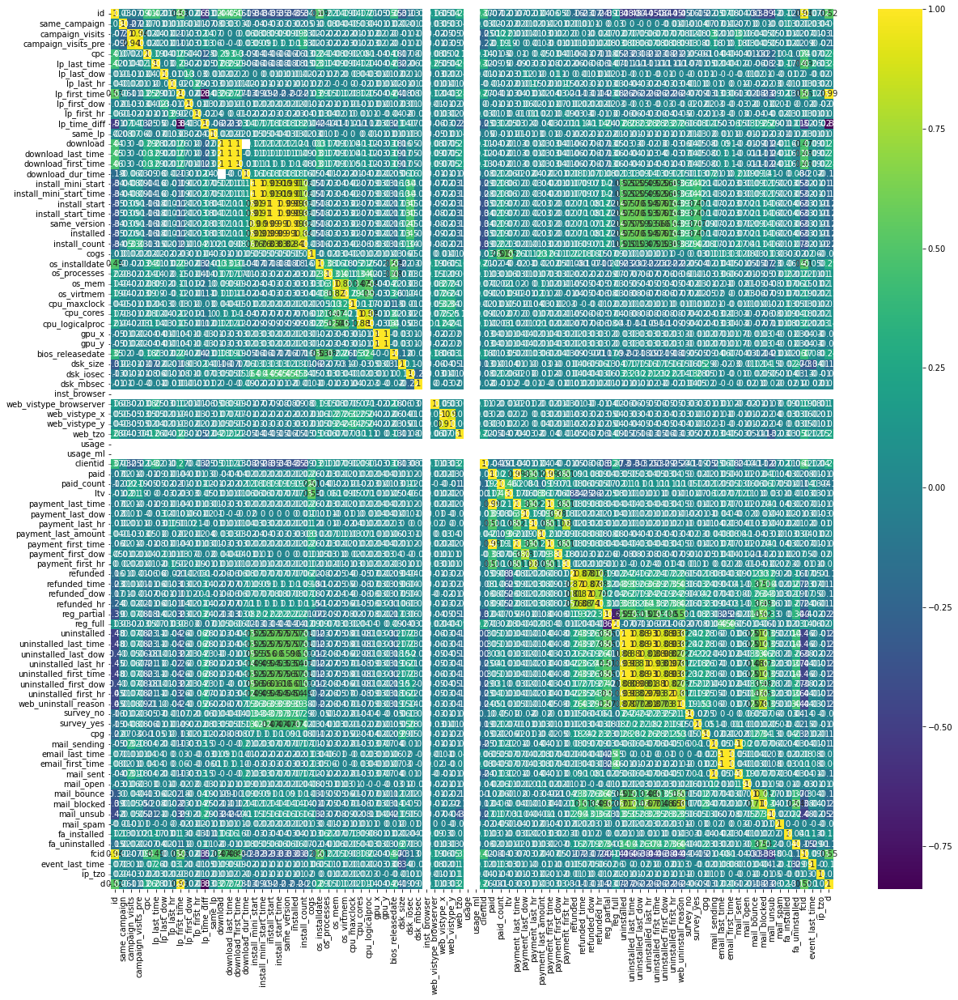

In [15]:
plt.figure(figsize=(20, 20))
sns.heatmap(df4.corr().round(2), annot=True, cmap='viridis')
plt.show()

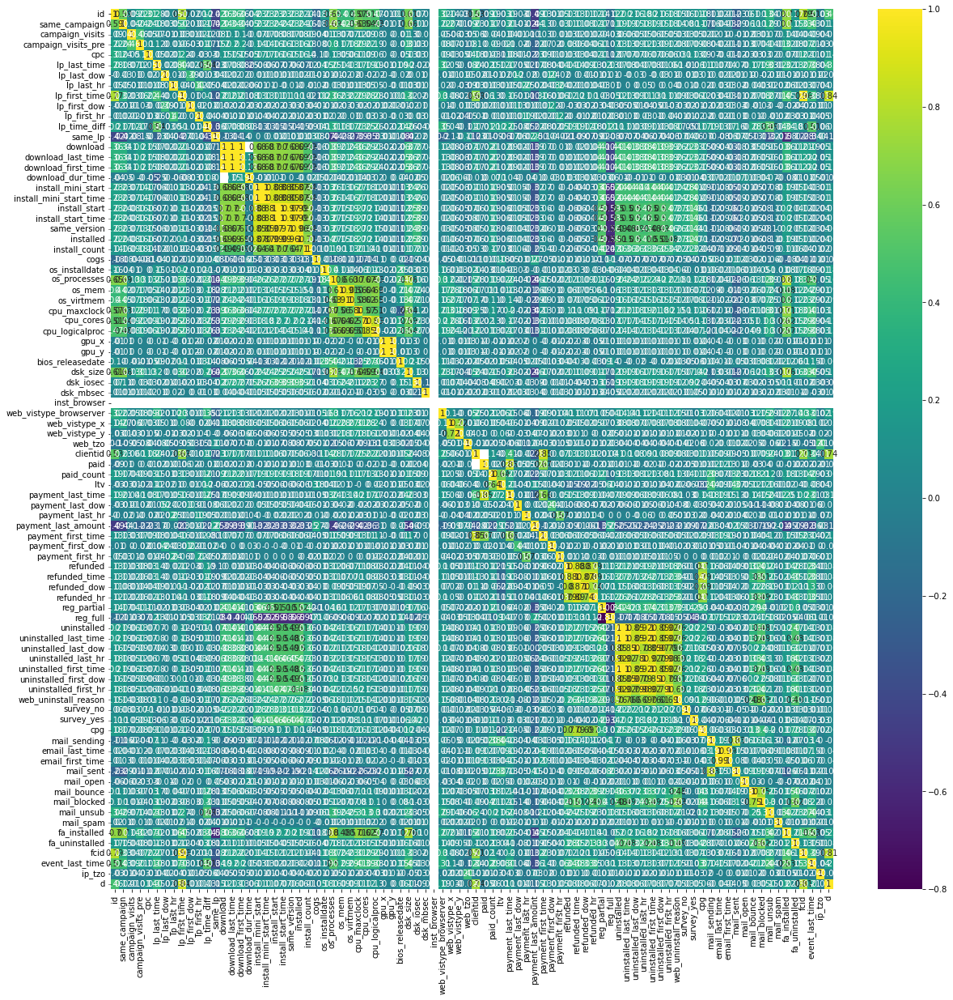

In [16]:
plt.figure(figsize=(20, 20))
sns.heatmap(df5.corr().round(2), annot=True, cmap='viridis')
plt.show()

_Теплові карти кореляції показують приблизно те ж саме, що і графіки розсіювання (скатерплоти). Порахована кореляція Пірсона показує лінійну залежність, можемо побачити стовпці, які найбільше корелюють (жовтий колір і значення наближається до 1). Варто звернути увагу, що деякі пари стовпців мають від'ємну кореляцію._

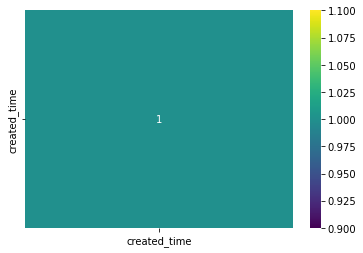

In [23]:
sns.heatmap(transac.corr().round(2), annot=True, cmap='viridis')
plt.show()

In [17]:
# Теплова карта із таблицею "transac" не несе інформаційного навантаження, оскільки всі стовпці, крім одного мають формат  object

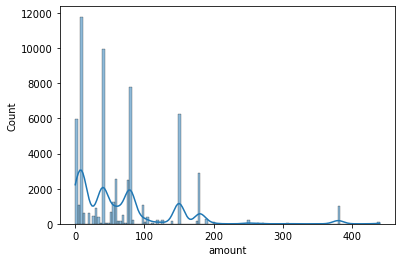

In [12]:
sns.histplot(ccsubs['amount'], kde=True)
plt.show()

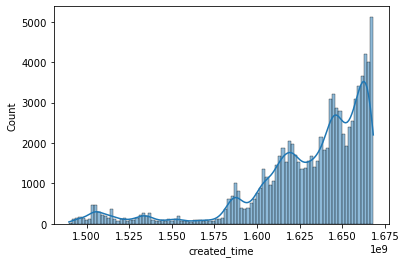

In [33]:
sns.histplot(transac['created_time'], kde=True)
plt.show()

_Крім того, на графіку histplot видно, що дані мають не рівномірний розподіл._

## >Попередня обробка даних

Оскільки набори даних df1, df2, df3, df4, df5 мають однакову кількість колонок і повністю співпадають за їх назвами, тому є сенс об'єднати дані набори в один. 

In [18]:
df1.shape

(3747, 148)

In [19]:
df2.shape

(4659, 148)

In [20]:
df3.shape

(4055, 148)

In [21]:
df4.shape

(5116, 148)

In [ ]:
df1.shape

In [25]:
df5.shape

(3848, 148)

In [43]:
inner_merged_df_1_2 = pd.merge(df1, df2, on=["clientid"])

In [44]:
inner_merged_df_1_2_3 = pd.merge(inner_merged_df_1_2, df3, on=["clientid"])

MemoryError: Unable to allocate 6.11 GiB for an array with shape (141, 5811939) and data type int64

In [ ]:
# коли обєдную далі df3 з об'єднаним, то видає помилку що не вистачає памяті. Тому df1-5 я все ж конкатинував

In [45]:
df = pd.concat([df1, df2, df3, df4, df5])

In [46]:
df.shape

(21425, 148)

In [40]:
inner_merged_df.shape

(118619, 295)

Необхідно об'єднати набори даних підписок з транзакціями. Оскільки за умовою завдання Користувач ідентифікується ClientID і GUID (унікальний штамп ПК, зазвичай 1 ПК = 1 користувач), то є сенс об'єднувати саме за колонкою GUID.

In [27]:
transac.shape

(92167, 19)

In [28]:
ccsubs.shape

(60932, 18)

In [35]:
inner_merged_transac_ccsubs = pd.merge(transac, ccsubs, on=["guid"])

In [36]:
inner_merged_transac_ccsubs.shape

(436706, 36)

Після цього, можна 2 отримані таблиці об'єднати в 1 за колонками ClientID і GUID.

In [51]:
inner_joined_total = df.join(
...     inner_merged_transac_ccsubs.set_index(["guid"]),
...     on=[ "guid"],
...     how="inner",
...     lsuffix="_x",
... )

In [52]:
inner_joined_total.shape

(433634, 183)

In [53]:
inner_joined_total.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 433634 entries, 0 to 3847
Columns: 183 entries, id to strategy_config_y
dtypes: float64(19), int64(77), object(87)
memory usage: 608.7+ MB


In [54]:
inner_joined_total.head()

,id,referrer,src_domain,src_url,campaign_last,campaign_first,at,ai,same_campaign,campaign_visits,...,amount_y,ltv,interval_sec,state_y,retry_count,descriptor_y,meta_data,log_json,strategy_id_y,strategy_config_y
0,4568921,-,NaN,NaN,activeTrail,activeTrail,NaN,NaN,0,0,...,179.99,0.00,0,once,1,NaN,{},"[{""time"":1584172543,""comment"":""failed purchase...",NaN,{}
13,4771733,-,NaN,NaN,activeTrail,activeTrail,NaN,NaN,0,0,...,179.99,179.99,0,once,0,NaN,{},"[{""time"":1583565465,""comment"":""success purchas...",NaN,{}
14,4779297,https://webmail.tctwest.net/webmail/src/read_b...,webmail.tctwest.net,webmail.tctwest.net/webmail/src/read_body.php,activeTrail,activeTrail,NaN,NaN,0,0,...,179.99,0.00,0,failed,1,NaN,{},"[{""time"":1583774976,""comment"":""failed purchase...",NaN,{}
14,4779297,https://webmail.tctwest.net/webmail/src/read_b...,webmail.tctwest.net,webmail.tctwest.net/webmail/src/read_body.php,activeTrail,activeTrail,NaN,NaN,0,0,...,179.99,179.99,0,once,0,NaN,{},"[{""time"":1583776791,""comment"":""success purchas...",NaN,{}
15,4978873,-,NaN,NaN,activeTrail,activeTrail,NaN,NaN,0,0,...,179.99,179.99,0,once,0,NaN,{},"[{""time"":1583590213,""comment"":""success purchas...",NaN,{}


#### Виведення пропущених значень у відсотках  по усім колонкам (одночасно бачу назви всіх колонок)

In [61]:
inner_joined_total.isna().sum().div(inner_joined_total.shape[0]).mul(100).round(2)[:60]

id                          0.00
referrer                    0.02
src_domain                  1.12
src_url                     1.12
campaign_last               1.63
campaign_first              0.36
at                         87.33
ai                         18.38
same_campaign               0.00
campaign_visits             0.00
campaign_visits_pre         0.00
kw                         93.42
campaign_platform_last      1.47
campaign_platform_first     0.13
tpm                         0.00
cpc                         0.00
dm                          0.00
fbclid                     99.90
gclid                       9.08
msclkid                    91.36
lp_last                     1.13
lp_last_time                0.00
lp_last_dow                 0.00
lp_last_hr                  0.00
lp_first                    0.03
lp_first_time               0.00
lp_first_dow                0.00
lp_first_hr                 0.00
lp_time_diff                0.00
same_lp                     0.00
visit     

In [62]:
inner_joined_total.isna().sum().div(inner_joined_total.shape[0]).mul(100).round(2)[61:121]

gpu_name                   1.35
gpu_x                      0.00
gpu_y                      0.00
sec_as                    51.08
sec_av                     1.63
sec_fw                    37.73
bios_releasedate           2.57
dsk_name                   1.35
dsk_size                   0.00
dsk_iosec                  0.00
dsk_mbsec                  0.00
inst_browser              99.98
web_vistype_browser        0.53
web_vistype_browserver     0.53
web_vistype_os            10.52
web_vistype_gpu           11.30
web_vistype_x             10.52
web_vistype_y             10.52
web_tzo                   10.67
usage                     71.43
usage_ml                  71.43
clientid                   3.27
paid                       0.00
paid_count                 0.00
ltv_x                      0.00
fa_offers                  0.00
payment_last_time          0.00
payment_last_dow           0.00
payment_last_hr            0.00
payment_last_amount        0.00
payment_first_time         0.00
payment_

In [64]:
inner_joined_total.isna().sum().div(inner_joined_total.shape[0]).mul(100).round(2)[122:182]

fa_install            0.00
fa_installed          0.00
fa_version_last       2.18
fa_version_first      2.21
fa_uninstalled        0.00
inst_apps             0.00
pc_processes          0.00
pc_software           0.00
pc_hardware           0.00
fa_config             0.00
fa_strategy           0.00
fa_profile            0.00
fa_menustore         28.38
guid                  0.00
fcid                  0.01
event_last_time       0.00
user_agent            0.11
ip                    0.00
geo_x                 0.00
ip_city               0.73
ip_state_iso          0.53
ip_state_name         0.53
ip_tz                 0.32
ip_tzo                0.00
risk                  0.00
d                     0.00
id_x                  0.00
customer_id_x         0.00
subscription_id       0.00
email                 2.36
geo                   0.05
amount_x              0.00
returns               0.00
item_name             0.00
item_key              2.14
campaign             26.82
state_x               0.00
c

In [73]:
inner_joined_total.isna().sum().div(inner_joined_total.shape[0]).mul(100).round(2)[182:183]

strategy_config_y    0.0
dtype: float64

In [74]:
from sklearn.preprocessing import OneHotEncoder

In [75]:
encoder = OneHotEncoder()

In [76]:
# навчаю енкодер на вхідних даних
encoder.fit(inner_joined_total)

TypeError: Encoders require their input to be uniformly strings or numbers. Got ['float', 'str']

In [ ]:
# Видає помилку, що різні типи даних, то мені потрібно перекодовувати окремо стовпчики?

In [ ]:
# Для прикладу я грубо, але просто відкинув стовпчики з object, щоб спробувати побудувати модель

In [79]:
df_new=inner_joined_total.select_dtypes(exclude=['object'])
df_new

,id,same_campaign,campaign_visits,campaign_visits_pre,cpc,lp_last_time,lp_last_dow,lp_last_hr,lp_first_time,lp_first_dow,...,id_y,customer_id_y,shopper_id,created_time_y,last_billing_time,next_billing_time,amount_y,ltv,interval_sec,retry_count
0,4568921,0,0,0,0.0000,1584172271,6,3,1581298412,7,...,667,65545,142723756.0,1584172543,1584172543,1584345343,179.99,0.00,0,1
13,4771733,0,0,0,0.0000,1583748070,1,21,1583565374,6,...,412,63518,141685516.0,1583565465,1583565465,0,179.99,179.99,0,0
14,4779297,0,0,0,0.0000,1583776693,1,11,1583573155,6,...,490,64167,142053226.0,1583774976,1583774976,1583947776,179.99,0.00,0,1
14,4779297,0,0,0,0.0000,1583776693,1,11,1583573155,6,...,498,64167,142056068.0,1583776791,1583776791,0,179.99,179.99,0,0
15,4978873,0,0,0,0.0000,1583763670,1,22,1583589692,6,...,413,63519,141813920.0,1583590213,1583590213,0,179.99,179.99,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3847,10597539,1,1,1,0.2649,1640245358,3,22,1600386785,4,...,32679,104720,182535232.0,1643789587,0,0,0.10,59.99,0,0
3847,10597539,1,1,1,0.2649,1640245358,3,22,1600386785,4,...,32821,104720,182535232.0,1643866572,0,0,0.10,59.99,0,0
3847,10597539,1,1,1,0.2649,1640245358,3,22,1600386785,4,...,51005,104720,182535232.0,1660210229,1660210229,0,55.99,0.00,0,0
3847,10597539,1,1,1,0.2649,1640245358,3,22,1600386785,4,...,54216,104720,182535232.0,1662243888,1662243888,0,55.99,0.00,0,0


In [80]:
df_new.isna().sum().div(df_new.shape[0]).mul(100).round(2)[:60]

id                          0.00
same_campaign               0.00
campaign_visits             0.00
campaign_visits_pre         0.00
cpc                         0.00
lp_last_time                0.00
lp_last_dow                 0.00
lp_last_hr                  0.00
lp_first_time               0.00
lp_first_dow                0.00
lp_first_hr                 0.00
lp_time_diff                0.00
same_lp                     0.00
download                    0.00
download_last_time          0.00
download_first_time         0.00
download_dur_time          23.60
install_mini_start          0.00
install_mini_start_time     0.00
install_start               0.00
install_start_time          0.00
same_version                0.00
installed                   0.00
install_count               0.00
cogs                        0.00
os_installdate              1.35
os_processes                0.00
os_mem                      0.00
os_virtmem                  0.00
cpu_maxclock                0.00
cpu_cores 

In [86]:
df_new.isna().sum().div(df_new.shape[0]).mul(100).round(2)[61:96]

uninstalled_last_dow       0.00
uninstalled_last_hr        0.00
uninstalled_first_time     0.00
uninstalled_first_dow      0.00
uninstalled_first_hr       0.00
web_uninstall_reason       0.00
survey_no                  0.00
survey_yes                 0.00
cpg                        0.00
mail_sending               0.00
email_last_time            0.00
email_first_time           0.00
mail_sent                  0.00
mail_open                  0.00
mail_bounce                0.00
mail_blocked               0.00
mail_unsub                 0.00
mail_spam                  0.00
fa_installed               0.00
fa_uninstalled             0.00
fcid                       0.01
event_last_time            0.00
ip_tzo                     0.00
d                          0.00
created_time_x             0.00
id_y                       0.00
customer_id_y              0.00
shopper_id                10.19
created_time_y             0.00
last_billing_time          0.00
next_billing_time          0.00
amount_y

In [97]:
df_new.describe(include='all').T

,count,mean,std,min,25%,50%,75%,max
id,433634.0,1.393976e+07,6.677218e+06,667.0,1.063001e+07,1.114785e+07,1.176701e+07,2.927966e+07
same_campaign,433634.0,9.318688e-01,2.519712e-01,0.0,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
campaign_visits,433634.0,1.949856e+00,2.083300e+01,0.0,1.000000e+00,1.000000e+00,1.000000e+00,1.063000e+03
campaign_visits_pre,433634.0,1.599247e+00,1.200618e+01,0.0,1.000000e+00,1.000000e+00,1.000000e+00,6.100000e+02
cpc,433634.0,3.887381e-01,2.945998e-01,0.0,2.357000e-01,3.490000e-01,4.887000e-01,1.302140e+01
...,...,...,...,...,...,...,...,...
next_billing_time,433634.0,7.171933e+08,8.160814e+08,0.0,0.000000e+00,0.000000e+00,1.644121e+09,1.703693e+09
amount_y,433634.0,5.947924e+01,5.830630e+01,0.0,9.990000e+00,5.499000e+01,7.999000e+01,4.399900e+02
ltv,433634.0,4.953346e+01,6.397292e+01,0.0,0.000000e+00,2.999000e+01,7.999000e+01,7.499500e+02
interval_sec,433634.0,1.015609e+06,4.706131e+06,0.0,0.000000e+00,0.000000e+00,0.000000e+00,9.460800e+07


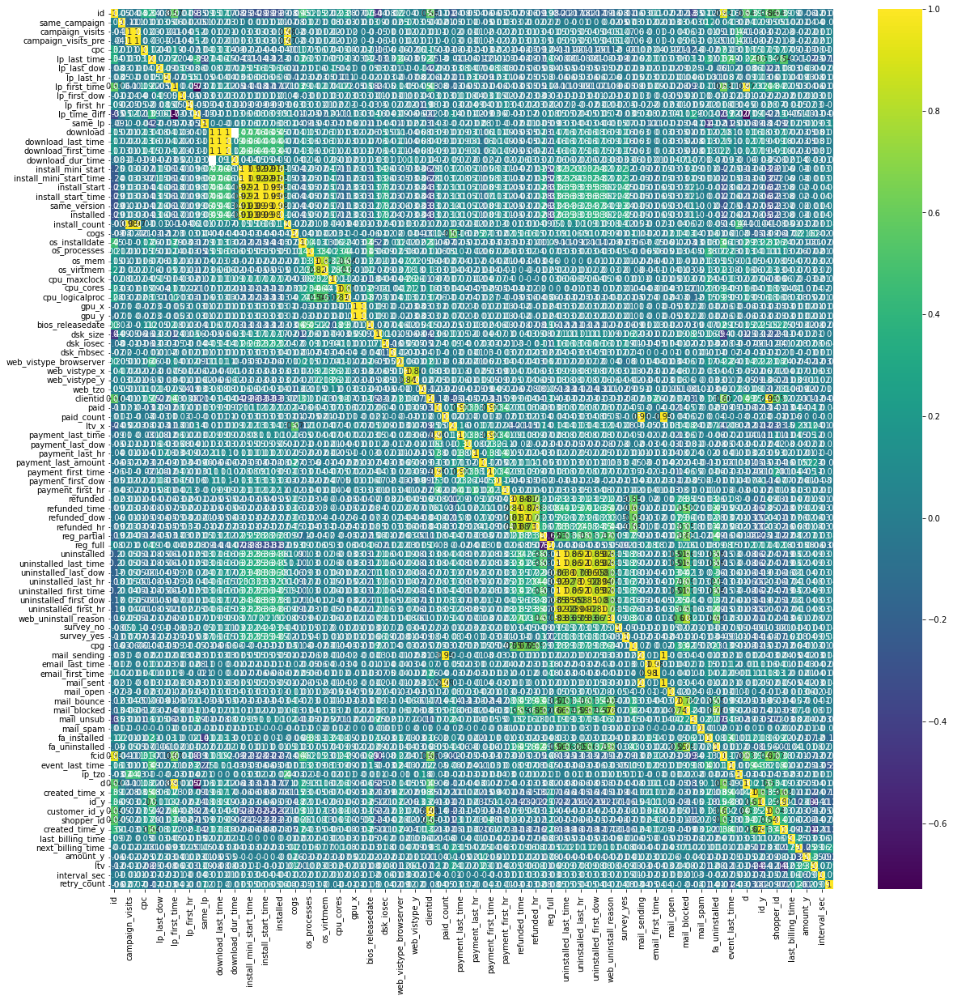

In [89]:
plt.figure(figsize=(20, 20))
sns.heatmap(df_new.corr().round(2), annot=True, cmap='viridis')
plt.show()

In [ ]:
# Для спрощення дропнув стовпчики з налами, щоб просто подивитись що з моделю буде

In [98]:
df_new.drop(columns=['download_dur_time', 'os_installdate', 'bios_releasedate', 'web_vistype_browserver', 'web_vistype_x', 'web_vistype_y', 'web_tzo', 'clientid', 'fcid', 'shopper_id'], inplace=True)

In [90]:
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.metrics import r2_score as r2, \
                            mean_squared_error as mse, \
                            mean_absolute_error as mae, \
                            mean_absolute_percentage_error as mape
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import StackingRegressor

In [100]:
X = df_new.drop(columns=['payment_last_amount'])
y = df_new['payment_last_amount']

In [101]:
X.shape

(433634, 85)

In [102]:
y.shape

(433634,)

### Побудова  прогнозної моделі за допомогою алгоритму "Дерево рішень"

In [103]:
model = DecisionTreeRegressor()

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1)

model.fit(X_train, y_train)

MemoryError: Unable to allocate 211. MiB for an array with shape (85, 325225) and data type float64

In [ ]:
# знову проблема з памятю

In [ ]:
# ПИТАННЯ є ще головне: То як же знайти ризиковану транзакцію, яка стане поверненням платежу (стан=відкликання 
або відшкодування+комісії)? Я навіть не розумію яку модель будувати